<a href="https://colab.research.google.com/github/ndominutti/TP_supervised_learning/blob/main/TP_AprendizajeSupervisado.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
#Esta parte clona el repositorio de github con los datos necesarios para correr la notebook y accede al DIR
!git clone https://github.com/ndominutti/TP_supervised_learning.git
%cd TP_supervised_learning

In [3]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold, train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, confusion_matrix, make_scorer, fbeta_score
import yaml
from yaml.loader import SafeLoader
import seaborn as sns
import plotly.express as px
import plotly.offline as pyo
from notebooks_auxiliares.auxiliar import AuxTargetEncoding, plot_matriz_confusion, configure_plotly_browser_state

In [4]:
fbeta = make_scorer(fbeta_score, beta=.4)

In [5]:
with open('config.yaml','r') as config:
    conf = yaml.load(config, SafeLoader)
    RANDOM_STATE= conf['random_state']

In [6]:
df = pd.read_csv('data/training_data.csv')

In [7]:
duplicados = df.groupby(['acousticness', 'danceability', 'duration', 'energy',
                        'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
                        'speechiness', 'tempo', 'time_signature', 'valence', 'label']).size()
duplicados = duplicados[duplicados>1]

In [8]:
duplicados

acousticness  danceability  duration  energy  instrumentalness  key  liveness  loudness  mode  speechiness  tempo    time_signature  valence  label
0.000986      0.578         188013    0.8250  0.000000          1    0.1760    -6.107    1     0.3220       130.089  4               0.283    0        2
0.002130      0.733         293543    0.5430  0.000169          1    0.0703    -10.002   1     0.0445       106.019  4               0.118    0        2
0.005870      0.825         220627    0.8320  0.000789          5    0.1140    -5.853    0     0.0403       122.021  4               0.713    1        2
0.025400      0.541         205200    0.8540  0.000125          2    0.6510    -6.196    1     0.1550       86.044   4               0.454    0        2
0.046900      0.311         208467    0.3250  0.000000          2    0.1390    -9.042    1     0.0283       65.090   1               0.668    1        2
0.137000      0.666         211931    0.9480  0.000000          10   0.1920    -2.776  

In [9]:
df = df.drop_duplicates(['acousticness', 'danceability', 'duration', 'energy',
                        'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
                        'speechiness', 'tempo', 'time_signature', 'valence', 'label'])

In [10]:
df.to_csv('data/df_sin_duplicados.csv', index=False)

---

# EDA

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 736 entries, 0 to 749
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   acousticness      736 non-null    float64
 1   danceability      736 non-null    float64
 2   duration          736 non-null    int64  
 3   energy            736 non-null    float64
 4   instrumentalness  736 non-null    float64
 5   key               736 non-null    int64  
 6   liveness          736 non-null    float64
 7   loudness          736 non-null    float64
 8   mode              736 non-null    int64  
 9   speechiness       736 non-null    float64
 10  tempo             736 non-null    float64
 11  time_signature    736 non-null    int64  
 12  valence           736 non-null    float64
 13  label             736 non-null    int64  
dtypes: float64(9), int64(5)
memory usage: 86.2 KB


Observamos que todas nuestras features son numericas

In [10]:
df.isna().all() # No hay registros incompletos

acousticness        False
danceability        False
duration            False
energy              False
instrumentalness    False
key                 False
liveness            False
loudness            False
mode                False
speechiness         False
tempo               False
time_signature      False
valence             False
label               False
dtype: bool

In [11]:
df.describe()

,acousticness,danceability,duration,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,label
count,736.000000,736.000000,736.000000,736.000000,736.000000,736.000000,736.000000,736.000000,736.000000,736.000000,736.000000,736.000000,736.000000,736.000000
mean,0.357756,0.596216,220104.024457,0.595018,0.099652,4.870924,0.203839,-8.495209,0.737772,0.098996,120.735997,3.906250,0.497943,0.601902
std,0.337833,0.172419,66116.637710,0.252775,0.258568,3.633319,0.178133,5.022693,0.440145,0.105085,28.264504,0.387792,0.239058,0.489839
min,0.000001,0.107000,33840.000000,0.009250,0.000000,0.000000,0.024000,-29.601000,0.000000,0.023400,55.747000,1.000000,0.033200,0.000000
25%,0.037250,0.477750,185040.250000,0.423750,0.000000,1.000000,0.094650,-10.178250,0.000000,0.035875,99.145250,4.000000,0.298000,0.000000
50%,0.249500,0.606500,215108.500000,0.631500,0.000010,5.000000,0.129000,-7.270000,1.000000,0.048650,121.056500,4.000000,0.483000,1.000000
75%,0.679250,0.716250,244390.000000,0.804250,0.002360,8.000000,0.268250,-5.061250,1.000000,0.112250,138.163750,4.000000,0.683500,1.000000
max,0.994000,0.986000,675360.000000,0.995000,0.967000,11.000000,0.979000,-0.533000,1.000000,0.721000,204.162000,5.000000,0.975000,1.000000


In [12]:
# Observamos un pequeño desbalance para la clase positiva (le gusta la cancion) en este dataset
df.label.value_counts(normalize = True)*100

1    60.190217
0    39.809783
Name: label, dtype: float64

Parece haber una correlacion lineal de casi el 50% con varias features, por ejemplo acousticness, speechinees, energy and loudness.

In [13]:
df.drop("label", axis = 1).corr()[abs(df.corr())>0.4]

,acousticness,danceability,duration,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
acousticness,1.000000,-0.418035,NaN,-0.781132,NaN,NaN,NaN,-0.693815,NaN,NaN,NaN,NaN,NaN
danceability,-0.418035,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.484453
duration,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
energy,-0.781132,NaN,NaN,1.000000,NaN,NaN,NaN,0.829014,NaN,NaN,NaN,NaN,NaN
instrumentalness,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,-0.415219,NaN,NaN,NaN,NaN,NaN
key,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
liveness,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
loudness,-0.693815,NaN,NaN,0.829014,-0.415219,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
mode,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
speechiness,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN


Observamos que varias features se encuentran correlacionadas, las que poseen mayores problemas de multicolinealidad son `acousticness`, `danceability`, `energy` y `loudness`.

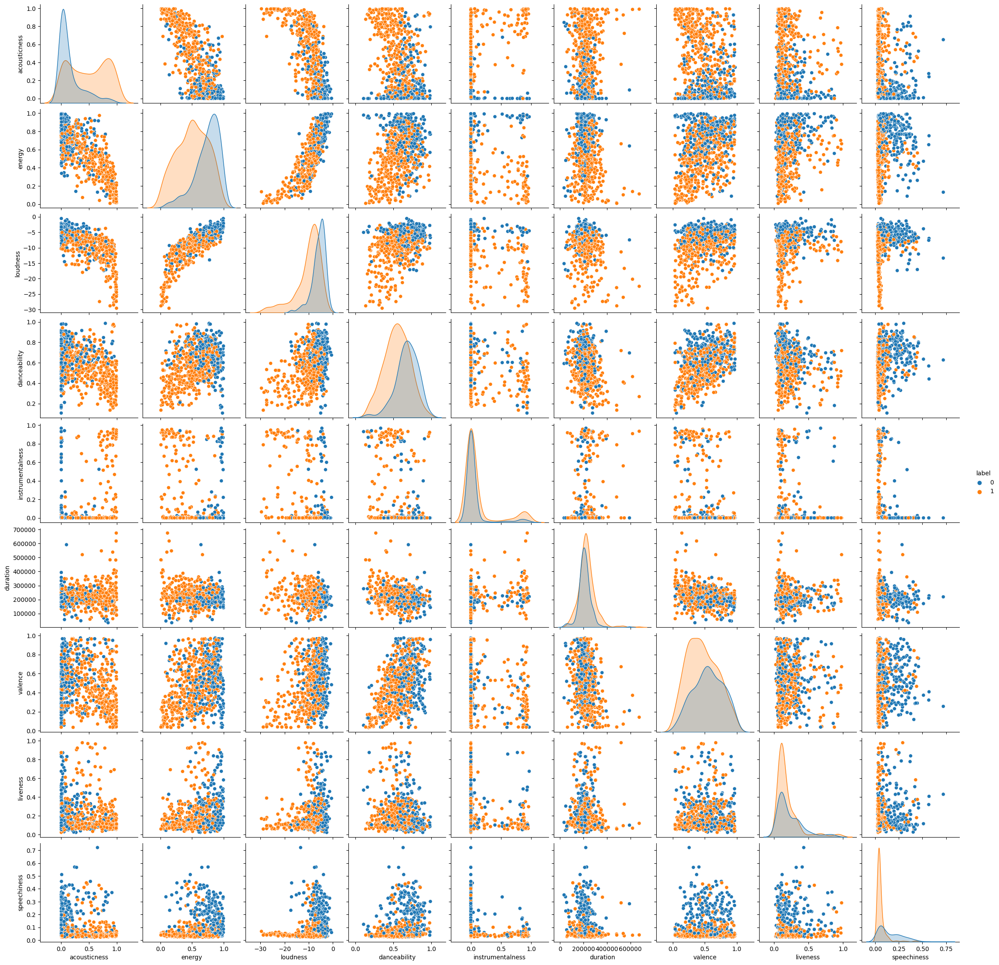

In [14]:
cols = ["acousticness", "energy", "loudness", "danceability", "instrumentalness", "duration", "valence", "liveness", "speechiness", "label"]
sns.pairplot(df.loc[:, cols], hue = 'label')
plt.show()

Observamos que varias features presentan una distribucion que se asemeja a una gaussiana. 

---

# Métodos lineales

In [11]:
X  = df.drop(columns='label')
y  = df['label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state=RANDOM_STATE, stratify=y)

### FEATURE SELECTION - REDUCCION DE LA DIMENSIONALIDAD

Dado que observamos un grado de correlacion alto entre algunos de los regresores, vamos a utilizar algunos metodos para seleccionar variables, y reducir la dimensionalidad de nuestro problema

* REGRESION LOGISTICA (REGULARIZACION L1)
* LDA

In [20]:
pipe_feature_selector_lr = Pipeline(steps=[("estandarizacion", StandardScaler()), 
                                        ("clasificador", LogisticRegression(C = 0.01, penalty= "l1", solver="saga"))])
pipe_feature_selector_lr.fit(X_train, y_train)
pipe_feature_selector_lr = pd.concat([pd.Series(X_train.columns), pd.Series(abs(pipe_feature_selector_lr[1].coef_[0]))],\
                                                                             axis = 1).sort_values(by = 1, ascending= False)
pipe_feature_selector_lr.columns = ["features", "betas"]
pipe_feature_selector_lr.head(5)

,features,betas
9,speechiness,0.192963
0,acousticness,0.179992
1,danceability,0.000000
2,duration,0.000000
3,energy,0.000000


El metodo lasso (regularizacion L1), nos quita las features que no nos dan informacion nueva, observamos como nos quita `loudness`, `energy` y `danceability`, muy probablemente debido a la alta correlacion que habiamos mencionado que tenian con `acousticness`. 

#### LDA - REDUCCION DE LA DIMENSIONALIDAD

In [23]:
pipe_lda_reduction = Pipeline([("estandarizacion", StandardScaler()),
                          ("lda", LinearDiscriminantAnalysis())])

X_train_lda_reduction = pipe_lda_reduction.fit_transform(X_train, y_train)

X_test_lda_reduction = pipe_lda_reduction.transform(X_train)
X_test_lda_reduction.shape

(552, 1)

Con LDA, reducimos la dimensionalidad del problema de 13 regresores a 1. Este nuevo regresor, es el que maximiza la distancia entre los centroides de ambas categorias y minimiza la dispersion de las observaciones de cada categoria.

### REGRESION LOGISTICA CON FEATURE SELECTION (LASSO)

Vamos a probar una regresion logistica utilizando los regresores que nos selecciono la regularizacion L1

In [26]:
X_train_lr_lasso = X_train.loc[:, ["acousticness", "speechiness"]]
X_test_lr_lasso = X_test.loc[:, ["acousticness", "speechiness"]]

pipe_regresion_logistica = Pipeline(steps = [("estandarizacion", StandardScaler()),
                                             ("clasificador", LogisticRegression())])

param_grid_lr = {
    "clasificador__C":[0.001, 0.01, 0.1, 1],
    "clasificador__penalty":["l1","l2"],
    "clasificador__solver":["liblinear"]
}

grid_search_lr_lasso = GridSearchCV(estimator = pipe_regresion_logistica,   
                                param_grid= param_grid_lr, 
                                scoring= fbeta, 
                                cv = 5)
grid_search_lr_lasso.fit(X_train_lr_lasso, y_train)
best_lr_lasso = grid_search_lr_lasso.best_estimator_

print("Validation set F_beta score: ",grid_search_lr_lasso.best_score_) 

Validation set F_beta score:  0.8291751503364463


#### METRICAS LOGISTIC REGRESSION CON FEATURE SELECTION (LASSO)

In [27]:
fbeta_score(y_test, best_lr_lasso.predict(X_test_lr_lasso), beta=0.4)

0.8338941572346283

In [28]:
coeficientes_best_lr_lasso = pd.concat([pd.Series(X_train_lr_lasso.columns),pd.Series(best_lr_lasso[1].coef_[0])], axis = 1)
coeficientes_best_lr_lasso.columns = ["FEATURES", "BETAS"]
coeficientes_best_lr_lasso

,FEATURES,BETAS
0,acousticness,1.287340
1,speechiness,-1.301935


**Conclusion:** Podemos inferir que a nuestro usuario le gustan las pistas acusticas, por lo que deberiamos recomendarle de este genero principalmente. A su vez, notamos que no le gusta utilizar la plataforma para escuchar podcast de entrevistas o canciones con mucho contenido hablado como ser por ej el genero del rap. 

#### REGRESION LOGISTICA CON REDUCCION DE LA DIMENSIONALIDAD (LDA)

Vamos ahora a probar una regresion logistica utilizando el nuevo regresor, que obtuvimos con LDA, a ver si conseguimos una mejor performance, resignando interpretabilidad

In [29]:
pipe_lr_lda = Pipeline(steps = [("lda_reduction",pipe_lda_reduction),
                                ("lr", LogisticRegression())])

param_grid_lr_lda = {
    "lr__C":[1e-20,1e-5 ,0.0001, 0.0005, 0.001, 0.01],
    "lr__penalty":["l1","l2"],
    "lr__solver":["liblinear"]
}

grid_search_lr_lda = GridSearchCV(pipe_lr_lda, param_grid_lr_lda, scoring= fbeta).fit(X_train, y_train)

print("Validation set score: ",grid_search_lr_lda.best_score_) 
grid_search_lr_lda.best_params_

Validation set score:  0.8397516044304233


{'lr__C': 0.01, 'lr__penalty': 'l1', 'lr__solver': 'liblinear'}

#### METRICAS REGRESION LOGISTICA - LDA REDUCTION

In [30]:
fbeta_score(y_test, grid_search_lr_lda.predict(X_test), beta = 0.4)

0.838473400154202

In [31]:
print(classification_report(y_test, grid_search_lr_lda.predict(X_test)))

              precision    recall  f1-score   support

           0       0.63      0.85      0.73        73
           1       0.87      0.68      0.76       111

    accuracy                           0.74       184
   macro avg       0.75      0.76      0.74       184
weighted avg       0.78      0.74      0.75       184



In [32]:
y_hat = grid_search_lr_lda.predict(X_test)

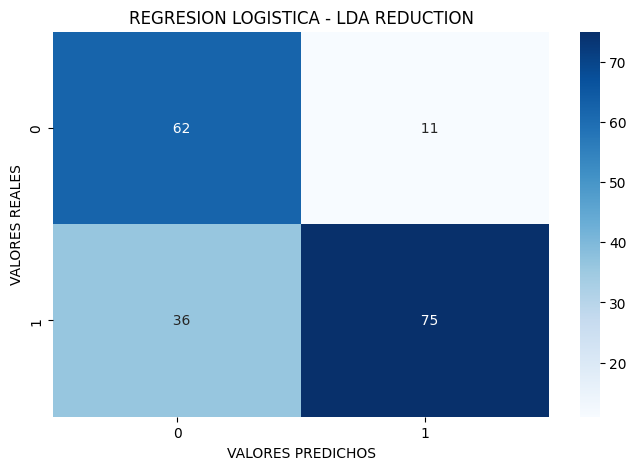

In [33]:
plot_matriz_confusion(
    y_test,
    y_hat,
    title='REGRESION LOGISTICA - LDA REDUCTION'
)

Obtuvimos un aumento de la performance del modelo, pero perdimos interpretabilidad

---

# Random Forest

In [12]:
pipeline = Pipeline([( "LE" , AuxTargetEncoding()),
                       ("rf", RandomForestClassifier())])

In [13]:
parameters = {
 'rf__n_estimators': [80, 100, 200, 300, 500],
 'rf__random_state': [RANDOM_STATE],
 'rf__criterion': ['gini', 'entropy'],
 'rf__min_impurity_decrease': [0.005, 0.05, 0.1],
 'rf__class_weight': [None, 'balanced', 'balanced_subsample'],
 'rf__ccp_alpha': [0.005, 0.05],
 'rf__n_jobs':[-1]
 }

In [14]:
grid_pipeline_rf = RandomizedSearchCV(pipeline, parameters, n_iter=50, cv=5, random_state=RANDOM_STATE, verbose=1, scoring=fbeta)

In [15]:
grid_pipeline_rf.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('LE', AuxTargetEncoding()),
                                             ('rf', RandomForestClassifier())]),
                   n_iter=50,
                   param_distributions={'rf__ccp_alpha': [0.005, 0.05],
                                        'rf__class_weight': [None, 'balanced',
                                                             'balanced_subsample'],
                                        'rf__criterion': ['gini', 'entropy'],
                                        'rf__min_impurity_decrease': [0.005,
                                                                      0.05,
                                                                      0.1],
                                        'rf__n_estimators': [80, 100, 200, 300,
                                                             500],
                                        'rf__n_jobs': [-1],
                                        'rf__random_state': [1203]},
                   random_state=1203,
                   scoring=make_scorer(fbeta_score, beta=0.4), verbose=1)

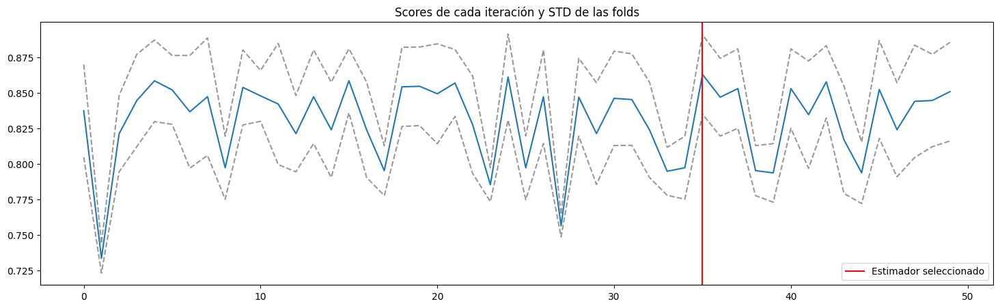

In [16]:
plt.figure(figsize=(18,5))
test_score = grid_pipeline_rf.cv_results_['mean_test_score']
std_score  = grid_pipeline_rf.cv_results_['std_test_score']
top_estimator = np.where(grid_pipeline_rf.cv_results_['rank_test_score']==1, 1, 0)
sns.lineplot(x=range(len(test_score)),y=test_score)
sns.lineplot(x=range(len(test_score)),y=test_score+std_score, color='black', ls='--',alpha=.4)
sns.lineplot(x=range(len(test_score)),y=test_score-std_score, color='black', ls='--',alpha=.4)
plt.axvline(np.argmax(test_score*top_estimator), 0, 1, color='red', label='Estimador seleccionado')
plt.title('Scores de cada iteración y STD de las folds')
plt.legend();

In [17]:
from notebooks_auxiliares.auxiliar import threshold_optimization
skf = StratifiedKFold()
result, top_threshold_rf = threshold_optimization( X_train,
                                                y_train,
                                                grid_pipeline_rf.best_estimator_,
                                                skf,
                                                min_aceptable_recall=.85)
result.head(1)

,trheshold,fbeta_score,recall_score,precision_score
7,0.52,0.931372,0.879602,0.945415


In [18]:
y_hat = grid_pipeline_rf.predict_proba(X_test)
y_hat = np.where(y_hat[:,1]>top_threshold_rf, 1, 0)

In [19]:
print(classification_report(y_test, y_hat))

              precision    recall  f1-score   support

           0       0.78      0.86      0.82        73
           1       0.90      0.84      0.87       111

    accuracy                           0.85       184
   macro avg       0.84      0.85      0.84       184
weighted avg       0.85      0.85      0.85       184



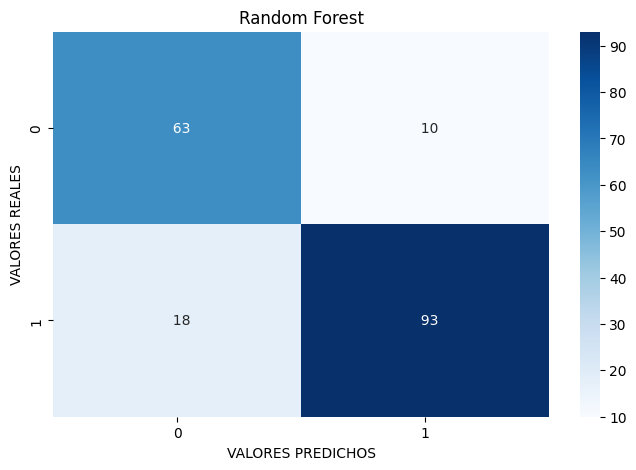

In [20]:
plot_matriz_confusion(
    y_test,
    y_hat,
    title='Random Forest'
)

In [21]:
feat_importance = pd.DataFrame(grid_pipeline_rf.best_estimator_[1].feature_importances_, columns=['score'])
feat_importance['feat'] = grid_pipeline_rf.best_estimator_[0].columns
feat_importance.sort_values(by='score',ascending=False).head(5)

,score,feat
39,0.170598,speechiness_vs_TE_label0
38,0.138812,speechiness_vs_TE_label1
3,0.095471,acousticness_vs_TE_label0
31,0.083754,loudness_vs_TE_label0
30,0.081061,loudness_vs_TE_label1


In [22]:
aux = AuxTargetEncoding()
df_fe = aux.fit_transform(df.drop(columns=['label']), df.label)
analysis = df_fe.copy()
analysis['label'] = pd.concat([y_train, y_test])

In [23]:
###linea solo necesaria para colab
configure_plotly_browser_state()
###
pyo.init_notebook_mode()
fig = px.scatter_3d(
    analysis,
    x='speechiness_vs_TE_label0',
    y='loudness_vs_TE_label0',
    z='acousticness_vs_TE_label0',
    color="label",
    title="Random Forest - Error analysis",
    width=600,
    height=600,
)
fig.show()

In [24]:
analysis['label'] = analysis.label.map({0:'clase negativa',1:'clase positiva'})

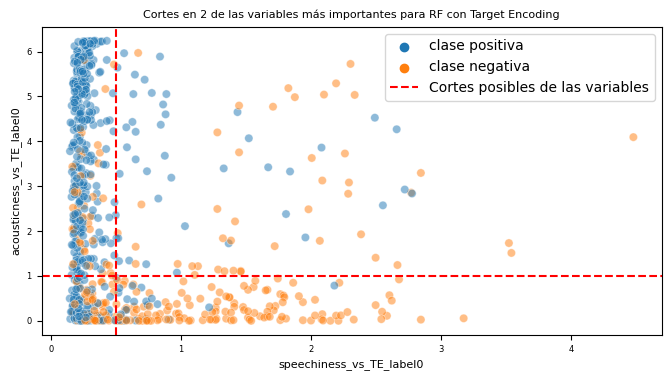

In [25]:
plt.figure(figsize=(8,4))
sns.scatterplot(
    x='speechiness_vs_TE_label0',
    y='acousticness_vs_TE_label0',
    hue='label',
    data=analysis,
    alpha=.5
)
plt.axvline(.5, 0,5,c='red', ls='--',label='Cortes posibles de las variables')
plt.axhline(1, 0,5,c='red', ls='--')
plt.title('Cortes en 2 de las variables más importantes para RF con Target Encoding', size=8)
plt.ylabel('acousticness_vs_TE_label0',size=8)
plt.xticks(size=6)
plt.yticks(size=6)
plt.xlabel('speechiness_vs_TE_label0',size=8)
plt.legend();

---

# Adaboost

In [26]:
from notebooks_auxiliares.auxiliar import AuxTargetEncodingNoDrop

In [27]:
pipeline = Pipeline([( "LE" , AuxTargetEncodingNoDrop()),
                       ("ada", AdaBoostClassifier())])

In [28]:
parameters = {
  'ada__n_estimators':[50,80,100,300,500],
  'ada__learning_rate':[.02,.05,.1,.2,.5,1],
  'ada__random_state':[RANDOM_STATE]
  }

In [29]:
grid_pipeline_ada = RandomizedSearchCV(pipeline, parameters, n_iter=50, cv=5, random_state=RANDOM_STATE, verbose=1, scoring=fbeta)

In [30]:
grid_pipeline_ada.fit(X_train, y_train)

c:\Users\nicolas.dominutti_ro\Desktop\aprendizaje_supervisado\TP_supervised_learning\env\lib\site-packages\sklearn\model_selection\_search.py:306: UserWarning:

The total space of parameters 30 is smaller than n_iter=50. Running 30 iterations. For exhaustive searches, use GridSearchCV.



Fitting 5 folds for each of 30 candidates, totalling 150 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('LE', AuxTargetEncodingNoDrop()),
                                             ('ada', AdaBoostClassifier())]),
                   n_iter=50,
                   param_distributions={'ada__learning_rate': [0.02, 0.05, 0.1,
                                                               0.2, 0.5, 1],
                                        'ada__n_estimators': [50, 80, 100, 300,
                                                              500],
                                        'ada__random_state': [1203]},
                   random_state=1203,
                   scoring=make_scorer(fbeta_score, beta=0.4), verbose=1)

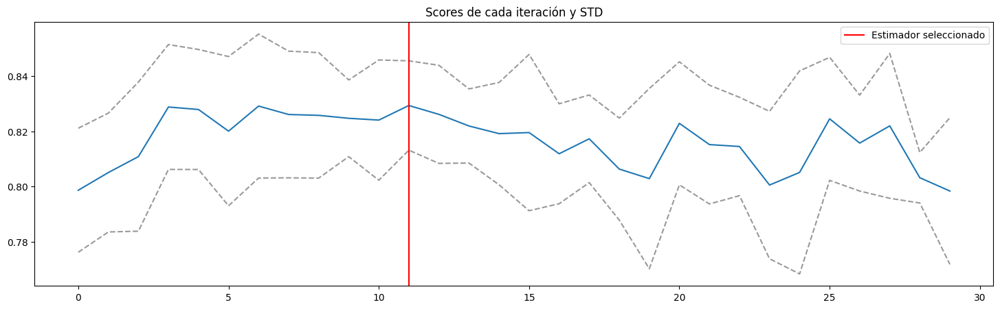

In [31]:
plt.figure(figsize=(18,5))
test_score = grid_pipeline_ada.cv_results_['mean_test_score']
std_score  = grid_pipeline_ada.cv_results_['std_test_score']
top_estimator = np.where(grid_pipeline_ada.cv_results_['rank_test_score']==1, 1, 0)
sns.lineplot(x=range(len(test_score)),y=test_score)
sns.lineplot(x=range(len(test_score)),y=test_score+std_score, color='black', ls='--',alpha=.4)
sns.lineplot(x=range(len(test_score)),y=test_score-std_score, color='black', ls='--',alpha=.4)
plt.axvline(np.argmax(test_score*top_estimator), 0, 1, color='red', label='Estimador seleccionado')
plt.title('Scores de cada iteración y STD de las folds')
plt.legend();

In [32]:
from notebooks_auxiliares.auxiliar import threshold_optimization
skf = StratifiedKFold()
result, top_threshold_ada = threshold_optimization( X_train,
                                                y_train,
                                                grid_pipeline_ada.best_estimator_,
                                                skf,
                                                min_aceptable_recall=.85)
result.head(1)

,trheshold,fbeta_score,recall_score,precision_score
6,0.51,0.884802,0.852555,0.893486


In [33]:
y_hat = grid_pipeline_ada.predict_proba(X_test)

In [34]:
y_hat = np.where(y_hat[:,1]>top_threshold_ada, 1, 0)

In [35]:
print(classification_report(y_test, y_hat))

              precision    recall  f1-score   support

           0       0.74      0.78      0.76        73
           1       0.85      0.82      0.83       111

    accuracy                           0.80       184
   macro avg       0.80      0.80      0.80       184
weighted avg       0.81      0.80      0.81       184



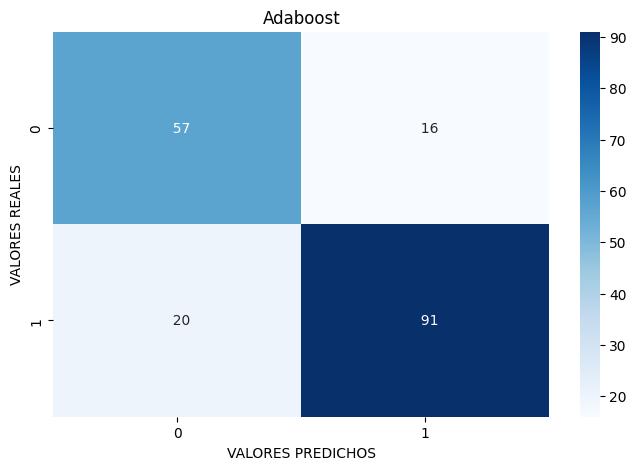

In [36]:
plot_matriz_confusion(
    y_test,
    y_hat,
    title='Adaboost'
)

In [37]:
aux = AuxTargetEncoding()
df_fe = aux.fit_transform(df.drop(columns=['label']), df.label)
analysis = df_fe.copy()
analysis['label'] = pd.concat([y_train, y_test])

In [38]:
###linea solo necesaria para colab
configure_plotly_browser_state()
###
pyo.init_notebook_mode()
fig = px.scatter_3d(
    analysis,
    x='speechiness_vs_TE_label0',
    y='loudness_vs_TE_label0',
    z='acousticness_vs_TE_label0',
    color="label",
    title="Adaboost - Error analysis",
    width=600,
    height=600,
)
fig.show()

---

# Voting Ensemble

In [39]:
from sklearn.ensemble import VotingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression

In [40]:
rf_params = {key.replace('rf__',''):value for key, value in grid_pipeline_rf.best_params_.items()}
ada_params = {key.replace('ada__',''):value for key, value in grid_pipeline_ada.best_params_.items()}

In [41]:
rf_ = RandomForestClassifier(**rf_params)
ada_ = AdaBoostClassifier(**ada_params)

In [42]:
ensemble = VotingClassifier([('rf', rf_), ('ada', ada_)], voting='soft')

In [43]:
ensemble.fit(X_train, y_train)

VotingClassifier(estimators=[('rf',
                              RandomForestClassifier(ccp_alpha=0.005,
                                                     class_weight='balanced_subsample',
                                                     min_impurity_decrease=0.005,
                                                     n_jobs=-1,
                                                     random_state=1203)),
                             ('ada',
                              AdaBoostClassifier(learning_rate=0.1,
                                                 n_estimators=80,
                                                 random_state=1203))],
                 voting='soft')

In [44]:
from notebooks_auxiliares.auxiliar import threshold_optimization
skf = StratifiedKFold()
result, top_threshold_ensemble = threshold_optimization( X_train,
                                                y_train,
                                                ensemble,
                                                skf,
                                                min_aceptable_recall=.9)
result.head(1)

,trheshold,fbeta_score,recall_score,precision_score
5,0.5,0.924302,0.903618,0.929791


In [45]:
y_hat = ensemble.predict_proba(X_test)

In [46]:
y_hat = np.where(y_hat[:,1]>top_threshold_ensemble, 1, 0)

In [47]:
print(classification_report(y_test, y_hat))

              precision    recall  f1-score   support

           0       0.78      0.85      0.82        73
           1       0.90      0.85      0.87       111

    accuracy                           0.85       184
   macro avg       0.84      0.85      0.84       184
weighted avg       0.85      0.85      0.85       184



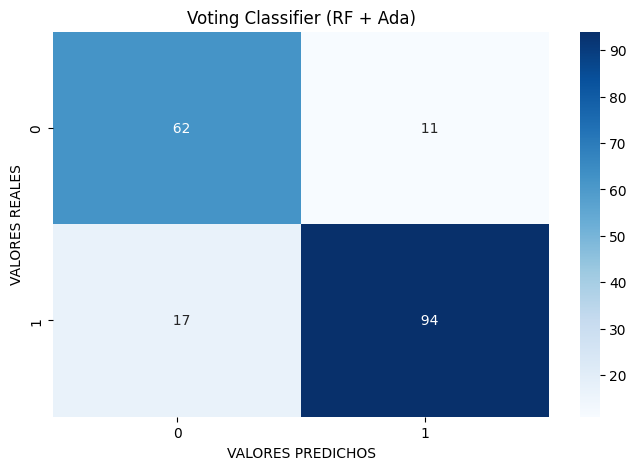

In [48]:
plot_matriz_confusion(
    y_test,
    y_hat,
    title='Voting Classifier (RF + Ada)'
)

In [49]:
y_hat = ensemble.predict_proba(X_test)
y_hat = np.where(y_hat[:,1]>top_threshold_ensemble, 1, 0)
analysis = X_test.copy()
analysis['y_true'] = y_test.copy().values
analysis['y_hat']  = y_hat
analysis['errors'] = analysis.y_hat - analysis.y_true

errores = analysis[analysis['errors']<0].index
aciertos = analysis[analysis['errors']==0].index

In [50]:
from notebooks_auxiliares.auxiliar import guardar_metricas
guardar_metricas('VotingClassifier',y_test, y_hat, path="data/comparacion_modelos.csv")

In [51]:
#Celda que no funciona en colab debido al versionado de python (3.7) que no permite
#upgradear sklearn a la versión 1.1.2, que permite a la clase StackingClassifier tomar
#como valor de cv='prefit'


# stack = StackingClassifier([('rf', grid_pipeline_rf), ('ada', grid_pipeline_ada)], 
#                             final_estimator=LogisticRegression(random_state=RANDOM_STATE), 
#                             cv='prefit')

In [52]:
#Al no funcionar la celda anterior en colab, debemos utilizar la versión anterior de skelarn (1.0.2)
#y fitear al StackingClassifier con los modelos y los best params (pero sin usar el feateng)
stack = StackingClassifier([('rf', rf_), ('ada', ada_)], 
                            final_estimator=LogisticRegression(random_state=RANDOM_STATE), 
                            cv=3)

In [53]:
stack.fit(X_test, y_test)

StackingClassifier(cv=3,
                   estimators=[('rf',
                                RandomForestClassifier(ccp_alpha=0.005,
                                                       class_weight='balanced_subsample',
                                                       min_impurity_decrease=0.005,
                                                       n_jobs=-1,
                                                       random_state=1203)),
                               ('ada',
                                AdaBoostClassifier(learning_rate=0.1,
                                                   n_estimators=80,
                                                   random_state=1203))],
                   final_estimator=LogisticRegression(random_state=1203))

In [54]:
skf = StratifiedKFold()
result, top_threshold_stack = threshold_optimization( X_train,
                                                y_train,
                                                stack,
                                                skf,
                                                min_aceptable_recall=.85)
result.head(1)

,trheshold,fbeta_score,recall_score,precision_score
10,0.55,0.848755,0.85545,0.847536


In [55]:
y_hat = ensemble.predict_proba(X_test)

In [56]:
y_hat = np.where(y_hat[:,1]>top_threshold_stack, 1, 0)

In [57]:
print(classification_report(y_test, y_hat))

              precision    recall  f1-score   support

           0       0.69      0.89      0.78        73
           1       0.91      0.74      0.82       111

    accuracy                           0.80       184
   macro avg       0.80      0.81      0.80       184
weighted avg       0.82      0.80      0.80       184



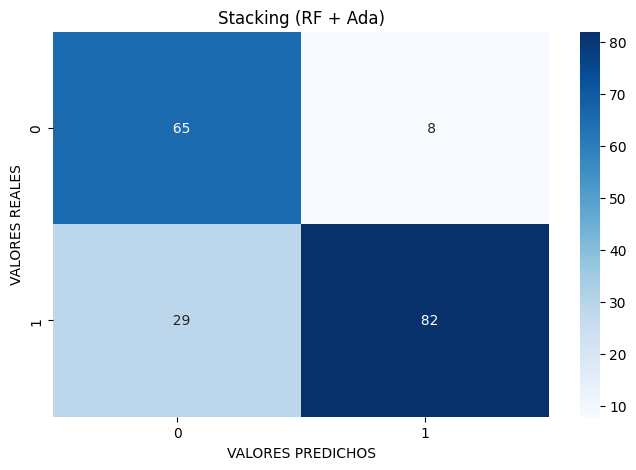

In [58]:
plot_matriz_confusion(
    y_test,
    y_hat,
    title='Stacking (RF + Ada)'
)

In [59]:
guardar_metricas('StackingClassifier',y_test, y_hat, path="data/comparacion_modelos.csv")

---

# Comparación de modelos

In [60]:
comparacion = pd.read_csv("data/comparacion_modelos.csv")

In [61]:
comparacion.sort_values(by='fbeta(beta=.4)',ascending=False).reset_index(drop=True).style.\
                                                highlight_max(axis=0,color='darkgreen',subset=comparacion.columns[1:])

,modelo,fbeta(beta=.4),Precision,Recall,TN,FP,FN,TP
0,rf,0.893342,0.902913,0.837838,63,10,18,93
1,VotingClassifier,0.888237,0.895238,0.846847,62,11,17,94
2,xgb,0.886549,0.900000,0.810811,63,10,21,90
3,StackingClassifier,0.882702,0.911111,0.738739,65,8,29,82
4,ada,0.846105,0.850467,0.819820,57,16,20,91
5,nb,0.839190,0.886076,0.630631,64,9,41,70
6,knn,0.810811,0.810811,0.810811,52,21,21,90


---

# Spotify test

Ahora vamos a utilizar un dataset de canciones de Spotify, descargado de la pagina Kaggle, para estimar que canciones podrian gustarle a esta persona.

https://www.kaggle.com/datasets/yasserh/song-popularity-dataset

In [62]:
kaggle_df = pd.read_csv("data/song_data.csv")

kaggle_df = kaggle_df.rename(columns = {'song_duration_ms':'duration',
                                      'audio_mode':'mode',
                                      'audio_valence':'valence'
                                      })
kaggle_df = kaggle_df.drop_duplicates(subset='song_name').dropna()
kaggle_df = kaggle_df[kaggle_df.song_name!='NaN'].reset_index(drop=True)                  
kaggle_df.head(3)

,song_name,song_popularity,duration,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,Boulevard of Broken Dreams,73,262333,0.00552,0.496,0.682,0.000029,8,0.0589,-4.095,1,0.0294,167.060,4,0.474
1,In The End,66,216933,0.01030,0.542,0.853,0.000000,3,0.1080,-6.407,0,0.0498,105.256,4,0.370
2,Seven Nation Army,76,231733,0.00817,0.737,0.463,0.447000,0,0.2550,-7.828,1,0.0792,123.881,4,0.324


In [63]:
#reordenamos las columnas de la data nueva y dropeamos las que no nos sirven
song_name = kaggle_df[['song_name']]
kaggle_df = kaggle_df[X_test.columns.values]

In [64]:
y_pred = grid_pipeline_rf.predict_proba(kaggle_df)[:,1]
y_pred_idx = np.argsort(y_pred)[::-1]
y_pred_proba = np.sort(y_pred)[::-1]

In [65]:
from notebooks_auxiliares.auxiliar import discretizacion_recomendacion

In [66]:
prediction = song_name.copy()
prediction = prediction.reindex(y_pred_idx)
prediction['proba'] = y_pred_proba
prediction['recomendacion'] = prediction.proba.apply(lambda x: discretizacion_recomendacion(x, top_threshold_rf))

In [67]:
prediction.head(10)

,song_name,proba,recomendacion
12167,Organs Made from Copper,0.945330,HOT SPOT
2694,Tiger Striped Sky,0.944169,HOT SPOT
2715,Sinking Ship,0.944169,HOT SPOT
13019,Hate the Way You Love Me,0.944139,HOT SPOT
4039,Party Of One (feat. Sam Smith),0.943707,HOT SPOT
12192,May I Have This Dance,0.943624,HOT SPOT
12230,Come Away With Me,0.943553,HOT SPOT
480,Bridge Over Troubled Water,0.943546,HOT SPOT
5044,Milius Space Cannon,0.943515,HOT SPOT
5032,OMBLEH,0.943494,HOT SPOT


In [ ]:
prediction.tail(10)

,song_name,proba,recomendacion
10438,Remind Me,0.077418,NO RECOMENDABLE
1688,Bootylicious,0.077057,NO RECOMENDABLE
103,Lo Siento,0.076792,NO RECOMENDABLE
9749,Gripped UP,0.076692,NO RECOMENDABLE
11464,BUBBLE GUM,0.076513,NO RECOMENDABLE
3446,Boy,0.074915,NO RECOMENDABLE
1985,Hypnotize,0.074786,NO RECOMENDABLE
7207,Hypnotize - 2014 Remastered Version,0.074151,NO RECOMENDABLE
61,"Taki Taki (with Selena Gomez, Ozuna & Cardi B)",0.073894,NO RECOMENDABLE
3063,ATLiens,0.073518,NO RECOMENDABLE


Vemos que speechiness y acousticness son variables súmamente importantes en la predicción

In [94]:
aux = pd.concat([kaggle_df, song_name], axis=1)
analysis = prediction.merge(aux, on='song_name', how='left')

###linea solo necesaria para colab
configure_plotly_browser_state()
###
pyo.init_notebook_mode()
fig = px.scatter_3d(
    analysis,
    x='speechiness',
    y='acousticness',
    z='liveness',
    color="proba",
    title="Recomendacion sobre dataset de Spotify",
    width=600,
    height=600,
)
fig.show()